 Step4: Mitigating model bias

 You need to mitigate the bias phenomenon in Step3. You can use methods including but not limited to
 expanding data, using better models, using data enhancement, reinforcement learning, modify loss function, etc.
 
 (Note: Thinking about and writing down the advantages and limitations of your chosen solution, which will help
 with subsequent projects)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder

In [2]:
train = pd.read_csv('train.csv', index_col=[0])
test = pd.read_csv('test.csv', index_col=[0])
np.random.seed(42)

target_column = None
for col in train.columns:
    if col not in test.columns:
        target_column = col
        break

def preprocess_data(df, unique_cols=['Gender', 'Race'], target_column=None):
    df_processed = df.copy()
    df_processed = df_processed.dropna()  # delete nan
    for col in ['Gender', 'Race']:  # Change to int
        if col in df_processed.columns:
            df_processed[col] = LabelEncoder().fit_transform(df_processed[col])
    num_cols = df_processed.select_dtypes(include=['int64', 'float64']).columns.tolist()
    cols = num_cols + [col for col in unique_cols if col in df_processed.columns]
    if target_column in df_processed.columns:
        cols.append(target_column)
    cols = list(set(cols))  # 去重
    return df_processed[cols]

train_processed = preprocess_data(train)
test_processed = preprocess_data(test)

In [3]:
# race-specific
sampled_data = train_processed.sample(frac=0.8, random_state=42)

# Change the races -- Black turn to White, White turn to Black
for i in range(len(sampled_data)):
    if sampled_data['Race'].iloc[i] == 0:
        sampled_data['Race'].iloc[i] = 1
    else:
        sampled_data['Race'].iloc[i] = 0
new_data = pd.concat([train_processed, sampled_data], axis=0)

# Disrupted and expanded dataset
new_data = shuffle(new_data, random_state=42)
X_train = new_data.drop(target_column, axis=1)
y_train = new_data[target_column]

print("raw data size:", len(train_processed))
print("expended data size:", len(new_data))
print("\nRace Distribution:")
print("raw data:")
print(train_processed['Race'].value_counts(normalize=True))
print("\nexpended data:")
print(new_data['Race'].value_counts(normalize=True))



C:\Users\tx_wu\AppData\Local\Temp\ipykernel_26244\3992038061.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sampled_data['Race'].iloc[i] = 0
C:\Users\tx_wu\AppData\Local\Temp\ipykernel_26244\3992038061.py:9: SettingWithCopyWarning: 
A v

KeyboardInterrupt: 

C:\Users\tx_wu\AppData\Local\Temp\ipykernel_26488\1008566811.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=gender_cnt.index, y=gender_cnt.values, palette='pastel')


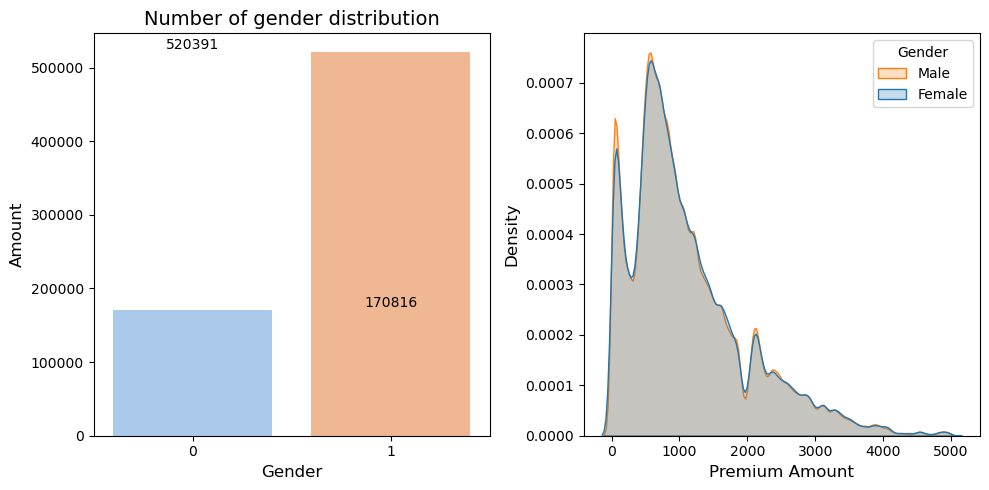

C:\Users\tx_wu\AppData\Local\Temp\ipykernel_26488\1008566811.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=race_cnt.index, y=race_cnt.values, palette='pastel')


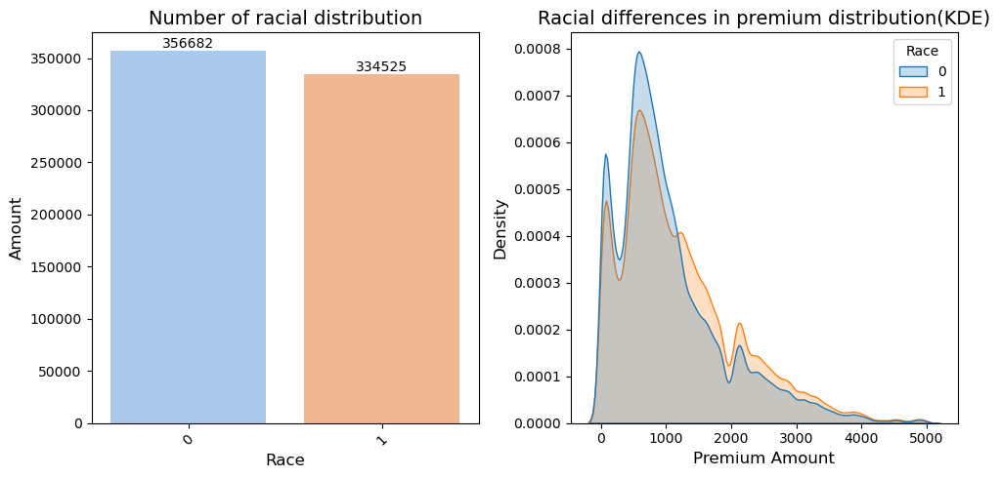

In [4]:
# visualization(new_train set)
plt.figure(figsize=(10, 5))
# gender
plt.subplot(1, 2, 1)
gender_cnt = new_data['Gender'].value_counts()
sns.barplot(x=gender_cnt.index, y=gender_cnt.values, palette='pastel')
plt.title('Number of gender distribution', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Amount', fontsize=12)
for i, cnt in enumerate(gender_cnt.values):
    plt.text(i, cnt, str(cnt), ha='center', va='bottom')
# density
plt.subplot(1, 2, 2)
sns.kdeplot(
    data=new_data,
    x='Premium Amount',
    hue='Gender',
    fill=True,
    common_norm=False,
    bw_adjust=0.7,               
)
plt.legend(title='Gender', labels=['Male', 'Female'], frameon=True)
plt.xlabel('Premium Amount', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.tight_layout()
plt.show()

# races
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
race_cnt = new_data['Race'].value_counts()
sns.barplot(x=race_cnt.index, y=race_cnt.values, palette='pastel')
plt.title('Number of racial distribution', fontsize=14)
plt.xlabel('Race', fontsize=12)
plt.ylabel('Amount', fontsize=12)
plt.xticks(rotation=45)
for i, cnt in enumerate(race_cnt.values):
    plt.text(i, cnt, str(cnt), ha='center', va='bottom')
# density
plt.subplot(1, 2, 2)
sns.kdeplot(data=new_data, x=target_column, hue='Race', fill=True, common_norm=False)
plt.title('Racial differences in premium distribution(KDE)', fontsize=14)
plt.xlabel('Premium Amount', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.tight_layout()
plt.show()

In [6]:
from sklearn.linear_model import LogisticRegression
from joblib import dump

X_train = new_data.drop(target_column, axis=1)
y_train = new_data[target_column]
X_test = test_processed
threshold = np.median(y_train)
y_train_binary = (y_train > threshold).astype(int)

model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train, y_train_binary)

dump(model, 'lr_after_mitigation.joblib')

y_pred = model.predict(X_test)
print("Predictions:", y_pred)

# save the new csv
new_data.to_csv('new_train_data.csv', index=False)

d:\000download\anaconda\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Predictions: [0 1 0 ... 0 0 1]


 Choose an evaluation metric from Assignment 2 and perform a bias evaluation on your trained model. Introduce
 the bias situation through the evaluation results.

In [ ]:
threshold = np.median(y_train)
y_pred = np.array(y_pred)
y_train_binary = list()
for val in y_train:
    if val > threshold:
        y_train_binary.append(1)
    else:
        y_train_binary.append(0)
y_train_binary = np.array(y_train_binary)

# Evaluate -- Equalized Opportunity
def equalized_opportunity_eval(A, y_true, y_pred):
    unique_groups = np.unique(A)
    eo_results = dict()
    i = 0
    while i < len(unique_groups):
        group = unique_groups[i]
        t_pos = 0
        act_pos = 0
        
        for j in range(len(A)):
            if A[j] == group:
                if y_true[j] == 1:
                    act_pos += 1
                    if y_pred[j] == 1:
                        t_pos += 1
        tpr = t_pos / act_pos if act_pos > 0 else 0
        eo_results[group] = tpr
        i += 1
    
    tpr_values = list(eo_results.values())
    smallest_diff = float('inf')
    largest_diff = -float('inf')
    smallest_ratio = float('inf')
    largest_ratio = -float('inf')
    
    for k in range(len(tpr_values)):
        for m in range(k+1, len(tpr_values)):
            diff = abs(tpr_values[k] - tpr_values[m])
            ratio = tpr_values[k] / tpr_values[m] if tpr_values[m] != 0 else float('inf')
            
            if diff < smallest_diff:
                smallest_diff = diff
            if diff > largest_diff:
                largest_diff = diff
            if ratio < smallest_ratio:
                smallest_ratio = ratio
            if ratio > largest_ratio:
                largest_ratio = ratio
    
    return eo_results, smallest_diff, largest_diff, smallest_ratio, largest_ratio

A_race = X_test['Race'].values
A_race_train = X_train['Race'].values
eo_results, min_diff, max_diff, min_ratio, max_ratio = equalized_opportunity_eval(A_race_train, y_train_binary, model.predict(X_train))

print("\nEqualized Opportunity Results:")
for group, tpr in eo_results.items():
    if group == 1:
        group_name = 'White'
    else:
        group_name = 'Black'
    print(f"  {group_name}: TPR = {tpr:.4f}")

print(f"Min TPR difference: {min_diff:.4f}")
print(f"Max TPR difference: {max_diff:.4f}")
print(f"Min TPR ratio: {min_ratio:.4f}")
print(f"Max TPR ratio: {max_ratio:.4f}")

A_race = X_test['Gender'].values
A_race_train = X_train['Gender'].values
eo_results, min_diff, max_diff, min_ratio, max_ratio = equalized_opportunity_eval(A_race_train, y_train_binary, model.predict(X_train))

print("\nEqualized Opportunity Results of Genders:")
for group, tpr in eo_results.items():
    if group == 0:
        group_name = 'Female'
    else:
        group_name = 'Male'
    print(f"  {group_name}: TPR = {tpr:.4f}")

print(f"Min TPR difference: {min_diff:.4f}")
print(f"Max TPR difference: {max_diff:.4f}")
print(f"Min TPR ratio: {min_ratio:.4f}")
print(f"Max TPR ratio: {max_ratio:.4f}")


Equalized Opportunity Results:
  Black: TPR = 0.2265
  White: TPR = 0.8077
Min TPR difference: 0.5811
Max TPR difference: 0.5811
Min TPR ratio: 0.2805
Max TPR ratio: 0.2805

Equalized Opportunity Results of Genders:
  Female: TPR = 0.5138
  Male: TPR = 0.5363
Min TPR difference: 0.0225
Max TPR difference: 0.0225
Min TPR ratio: 0.9580
Max TPR ratio: 0.9580
